In [36]:
import numpy as np
import libpysal as ps 
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from mgwr.utils import shift_colormap, truncate_colormap
import geopandas as gp
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [2]:
bus_stop_data = pd.read_csv('./집계구별 정류장수 및 승하차 데이터.csv')
seoul_shp = gp.read_file('./data/서울시 행정구역 및 집계구 정보(SHP)/서울시_집계구_4326.shp',encoding="EUC-KR")
pop_data = pd.read_csv('./data/pop/19년 12월 집계구코드별 평균생활인구수.csv')
seoul_shp.head()

,TOT_REG_CD,ADM_NM,ADM_CD,geometry
0,1101053010006,사직동,1101053,"POLYGON ((126.97033 37.57912, 126.97039 37.579..."
1,1101053010001,사직동,1101053,"POLYGON ((126.96613 37.57496, 126.96632 37.574..."
2,1101053010003,사직동,1101053,"POLYGON ((126.96645 37.57883, 126.96647 37.578..."
3,1101053010002,사직동,1101053,"POLYGON ((126.96877 37.57823, 126.96878 37.578..."
4,1101053010005,사직동,1101053,"POLYGON ((126.97399 37.57823, 126.97400 37.578..."


In [3]:
bus_stop_data.drop('Unnamed: 0',axis=1,inplace=True)
bus_stop_data.head()

,TOT_REG_CD,ADM_NM,ADM_CD,표준ID,정류소명,X좌표,Y좌표,승차,하차,월평균승차수,월평균하차수,정류장수,평균승차수,평균하차수
0,1101053010006,사직동,1101053,100900005,오거리.한옥마을입구,126.969547,37.579499,2756,357,88.903226,11.516129,2,1448.00,1947.000000
1,1101072010014,청운효자동,1101072,100900005,오거리.한옥마을입구,126.969547,37.579499,2756,357,88.903226,11.516129,5,13397.80,11219.800000
2,1101072010009,청운효자동,1101072,100900005,오거리.한옥마을입구,126.969547,37.579499,2756,357,88.903226,11.516129,6,8820.50,14221.166667
3,1101072010002,청운효자동,1101072,100900005,오거리.한옥마을입구,126.969547,37.579499,2756,357,88.903226,11.516129,4,2648.25,3558.750000
4,1101053010006,사직동,1101053,100900104,오거리.한옥마을입구,126.969737,37.579511,140,3537,4.516129,114.096774,2,1448.00,1947.000000


In [4]:
len(bus_stop_data['TOT_REG_CD'].unique())

10757

<ipython-input-5-9b66c2814c51>:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  seoul_shp.centroid.plot(ax=ax, c='black')


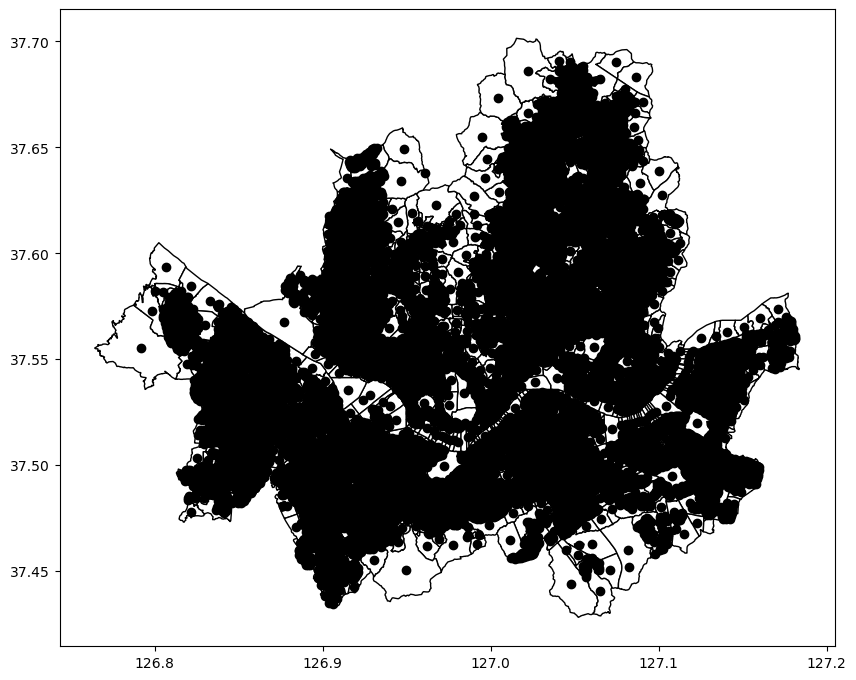

In [5]:
fig, ax = plt.subplots(figsize=(10,10))
seoul_shp.plot(ax=ax, **{'edgecolor':'black', 'facecolor':'white'})
seoul_shp.centroid.plot(ax=ax, c='black')
plt.show()

In [6]:
display(bus_stop_data.columns)
display(seoul_shp.columns)
display(pop_data.columns)
# 공통키 : TOT_REG_CD
display(bus_stop_data.info())
display(seoul_shp.info())
display(pop_data.info())

Index(['TOT_REG_CD', 'ADM_NM', 'ADM_CD', '표준ID', '정류소명', 'X좌표', 'Y좌표', '승차',
       '하차', '월평균승차수', '월평균하차수', '정류장수', '평균승차수', '평균하차수'],
      dtype='object')

Index(['TOT_REG_CD', 'ADM_NM', 'ADM_CD', 'geometry'], dtype='object')

Index(['집계구코드', '구별총생활인구수', '구별총생활인구수(월평균)'], dtype='object')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33955 entries, 0 to 33954
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   TOT_REG_CD  33955 non-null  int64  
 1   ADM_NM      33955 non-null  object 
 2   ADM_CD      33955 non-null  int64  
 3   표준ID        33955 non-null  int64  
 4   정류소명        33955 non-null  object 
 5   X좌표         33955 non-null  float64
 6   Y좌표         33955 non-null  float64
 7   승차          33955 non-null  int64  
 8   하차          33955 non-null  int64  
 9   월평균승차수      33955 non-null  float64
 10  월평균하차수      33955 non-null  float64
 11  정류장수        33955 non-null  int64  
 12  평균승차수       33955 non-null  float64
 13  평균하차수       33955 non-null  float64
dtypes: float64(6), int64(6), object(2)
memory usage: 3.6+ MB


None

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 19153 entries, 0 to 19152
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   TOT_REG_CD  19153 non-null  object  
 1   ADM_NM      19153 non-null  object  
 2   ADM_CD      19153 non-null  object  
 3   geometry    19153 non-null  geometry
dtypes: geometry(1), object(3)
memory usage: 598.7+ KB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19153 entries, 0 to 19152
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   집계구코드          19153 non-null  int64  
 1   구별총생활인구수       19153 non-null  float64
 2   구별총생활인구수(월평균)  19153 non-null  float64
dtypes: float64(2), int64(1)
memory usage: 449.0 KB


None

In [7]:
pop_data.rename(columns={'집계구코드':'TOT_REG_CD'},inplace=True)
pop_data['TOT_REG_CD'] = pop_data['TOT_REG_CD'].astype(str)
bus_stop_data['TOT_REG_CD']= bus_stop_data['TOT_REG_CD'].astype(str)

In [8]:
bus_stop_data_avg = bus_stop_data.groupby('TOT_REG_CD')[['평균승차수','평균하차수']].sum()
bus_stop_data_avg = bus_stop_data_avg.reset_index()
bus_stop_data_avg['평균승차수'] = bus_stop_data_avg['평균승차수'] / 31 # 19년 12월이 31일까지 있음, 월평균
bus_stop_data_avg['평균하차수'] = bus_stop_data_avg['평균하차수'] / 31
bus_stop_data_avg.rename(columns={'평균승차수':'월평균승차수','평균하차수':'월평균하차수'},inplace=True)
bus_stop_data_avg.head()

,TOT_REG_CD,월평균승차수,월평균하차수
0,1101053010001,197.354839,392.322581
1,1101053010002,371.935484,484.419355
2,1101053010003,2259.548387,3706.806452
3,1101053010004,6617.225806,9143.193548
4,1101053010005,6315.225806,6500.903226


In [9]:
bus_stop_count = bus_stop_data.groupby('TOT_REG_CD').size()
count = list()

for i, row in bus_stop_data_avg.iterrows():
    tot_reg_cd = row.loc['TOT_REG_CD'] # 집계구 코드를 가져와서 저장.
    count.append(bus_stop_count.loc[tot_reg_cd])

bus_stop_data_avg['정류장수'] = pd.Series(count)

In [10]:
bus_stop_data_avg.head()

,TOT_REG_CD,월평균승차수,월평균하차수,정류장수
0,1101053010001,197.354839,392.322581,3
1,1101053010002,371.935484,484.419355,2
2,1101053010003,2259.548387,3706.806452,12
3,1101053010004,6617.225806,9143.193548,5
4,1101053010005,6315.225806,6500.903226,6


In [11]:
# prepare dataset
data = bus_stop_data_avg.merge(seoul_shp,left_on='TOT_REG_CD',right_on='TOT_REG_CD')
data.head()

,TOT_REG_CD,월평균승차수,월평균하차수,정류장수,ADM_NM,ADM_CD,geometry
0,1101053010001,197.354839,392.322581,3,사직동,1101053,"POLYGON ((126.96613 37.57496, 126.96632 37.574..."
1,1101053010002,371.935484,484.419355,2,사직동,1101053,"POLYGON ((126.96877 37.57823, 126.96878 37.578..."
2,1101053010003,2259.548387,3706.806452,12,사직동,1101053,"POLYGON ((126.96645 37.57883, 126.96647 37.578..."
3,1101053010004,6617.225806,9143.193548,5,사직동,1101053,"POLYGON ((126.97145 37.57734, 126.97147 37.577..."
4,1101053010005,6315.225806,6500.903226,6,사직동,1101053,"POLYGON ((126.97399 37.57823, 126.97400 37.578..."


정류소데이터가 각 정류소ID별로 unique하게 집계되었기 때문에 집계구의 중복 문제가 발생한다.
<br>따라서 먼저 버스 데이터를 집계구별로 groupby를 하여 집계구의 데이터를 유일하게 만들어 주도록 하고 merge를 진행해야 한다.

In [12]:
data = data.merge(pop_data,left_on='TOT_REG_CD',right_on='TOT_REG_CD')
data.head()

,TOT_REG_CD,월평균승차수,월평균하차수,정류장수,ADM_NM,ADM_CD,geometry,구별총생활인구수,구별총생활인구수(월평균)
0,1101053010001,197.354839,392.322581,3,사직동,1101053,"POLYGON ((126.96613 37.57496, 126.96632 37.574...",277143.0,8940.096774
1,1101053010002,371.935484,484.419355,2,사직동,1101053,"POLYGON ((126.96877 37.57823, 126.96878 37.578...",1373417.0,44303.774194
2,1101053010003,2259.548387,3706.806452,12,사직동,1101053,"POLYGON ((126.96645 37.57883, 126.96647 37.578...",1245899.0,40190.290323
3,1101053010004,6617.225806,9143.193548,5,사직동,1101053,"POLYGON ((126.97145 37.57734, 126.97147 37.577...",1515584.0,48889.806452
4,1101053010005,6315.225806,6500.903226,6,사직동,1101053,"POLYGON ((126.97399 37.57823, 126.97400 37.578...",1038484.0,33499.483871


In [13]:
display(len(data['TOT_REG_CD'].unique()))
display(len(data))

10757

10757

In [14]:
sample_data = data[['TOT_REG_CD','ADM_NM','정류장수','월평균승차수','월평균하차수','구별총생활인구수(월평균)','geometry']]
sample_data.head()

,TOT_REG_CD,ADM_NM,정류장수,월평균승차수,월평균하차수,구별총생활인구수(월평균),geometry
0,1101053010001,사직동,3,197.354839,392.322581,8940.096774,"POLYGON ((126.96613 37.57496, 126.96632 37.574..."
1,1101053010002,사직동,2,371.935484,484.419355,44303.774194,"POLYGON ((126.96877 37.57823, 126.96878 37.578..."
2,1101053010003,사직동,12,2259.548387,3706.806452,40190.290323,"POLYGON ((126.96645 37.57883, 126.96647 37.578..."
3,1101053010004,사직동,5,6617.225806,9143.193548,48889.806452,"POLYGON ((126.97145 37.57734, 126.97147 37.577..."
4,1101053010005,사직동,6,6315.225806,6500.903226,33499.483871,"POLYGON ((126.97399 37.57823, 126.97400 37.578..."


In [15]:
center = seoul_shp.centroid
X = pd.Series(center.x)
Y = pd.Series(center.y)
sample_data.loc[:,'lon'] = X
sample_data.loc[:,'lat'] = Y
sample_data.head()

<ipython-input-15-4d5b3ede13d0>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = seoul_shp.centroid
C:\Users\user\anaconda3\lib\site-packages\pandas\core\indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value


,TOT_REG_CD,ADM_NM,정류장수,월평균승차수,월평균하차수,구별총생활인구수(월평균),geometry,lon,lat
0,1101053010001,사직동,3,197.354839,392.322581,8940.096774,"POLYGON ((126.96613 37.57496, 126.96632 37.574...",126.970311,37.578304
1,1101053010002,사직동,2,371.935484,484.419355,44303.774194,"POLYGON ((126.96877 37.57823, 126.96878 37.578...",126.965178,37.574151
2,1101053010003,사직동,12,2259.548387,3706.806452,40190.290323,"POLYGON ((126.96645 37.57883, 126.96647 37.578...",126.965513,37.576513
3,1101053010004,사직동,5,6617.225806,9143.193548,48889.806452,"POLYGON ((126.97145 37.57734, 126.97147 37.577...",126.969002,37.577092
4,1101053010005,사직동,6,6315.225806,6500.903226,33499.483871,"POLYGON ((126.97399 37.57823, 126.97400 37.578...",126.972772,37.578025


In [16]:
# sample_data[['월평균승차수','월평균하차수','구별총생활인구수(월평균)']].astype(int)
# sample_data.rename(columns={'정류장수':'NUM_BUS_STOP','월평균승차수':'AVG_MONTH_RIDE'
#                    ,'월평균하차수':'AVG_MONTH_GET_OFF','구별총생활인구수(월평균)':'AVG_TOT_POP'},inplace=True)
# sample_data.info()

In [17]:
len(sample_data)

10757

### Train and Test set 분리

In [19]:
# s_y = sample_data['구별총생활인구수(월평균)'].values.reshape((-1,1))
# s_X = sample_data[['정류장수', '월평균승차수', '월평균하차수','lon','lat']].values
# u = sample_data['lon']
# v = sample_data['lat']
# coords = list(zip(u,v))

# standardScaler적용

s_y = sample_data['구별총생활인구수(월평균)'].values.reshape((-1,1))
s_X = sample_data[['정류장수', '월평균승차수', '월평균하차수','lon','lat']].values
u = sample_data['lon']
v = sample_data['lat']
s_coords = list(zip(u,v))
# train set과 test set으로 나누는 과정으로 보인다.
# 해당 모델에 교차 검증이 있는 것으로 알고 있다.

# test set은 20%, 
# x_train, x_valid, y_train, y_valid = train_test_split(s_X, s_y, test_size=0.2, shuffle=True,random_state=34)

# cal_u = x_train['lon'].values
# cal_v = x_train['lat'].values
# cal_coords = list(zip(cal_u,cal_v))

# pred_u = x_valid['lon'].values
# pred_v = x_valid['lat'].values
# pred_coords = list(zip(pred_u,pred_v))

# # 위도, 경도 column 제거
# # display(x_train.columns)
# x_train.drop(['lon','lat'],axis=1,inplace=True)
# x_valid.drop(['lon','lat'],axis=1,inplace=True)

# # array로 변환
# X_train = scaler.fit_transform(x_train.values)
# Y_train = scaler.fit_transform(y_train.values.reshape((-1,1)))
# X_valid = scaler.fit_transform(x_valid.values)
# Y_valid = scaler.fit_transform(y_valid.values.reshape((-1,1)))

# 나눈 후 array로 만들어 주자..

# ------------- 원본 split ----------------
# np.random.seed(908)
# sample = np.random.choice(range(10757), 10)
# mask = np.ones_like(s_y,dtype=bool).flatten() # s_y와 같은 shape과 datatype을 가진 array를 반환하고 flatten진행.
# mask[sample] = False # masking된 데이터들에 False를 입력.

# cal_coords = coords[mask]
# cal_y = s_y[mask]
# cal_X = s_X[mask]

# pred_coords = coords[~mask]
# pred_y = s_y[~mask]
# pred_X = s_X[~mask]
# ---------------------------------------------

# data 정규화
s_X = (s_X - s_X.mean(axis=0)) / s_X.std(axis=0) 

s_y = s_y.reshape((-1,1))

s_y = (s_y - s_y.mean(axis=0)) / s_y.std(axis=0)

In [21]:
#Calibrate GWR model

gwr_selector = Sel_BW(s_coords, s_y, s_X)
gwr_bw = gwr_selector.search(bw_min=2)
print(gwr_bw)
gwr_model = GWR(s_coords, s_y, s_X, gwr_bw)
gwr_results = gwr_model.fit()

55.0


In [22]:
gwr_results.params[0:5]

array([[ -9.9550829 ,   0.27787439,   1.73772929,  -1.00102089,
         -6.66755123,   5.25811235],
       [ -5.41053922,   0.21756886,   0.81167485,  -0.15559425,
          4.13350374,   3.00105449],
       [-10.14578311,   0.26563706,   1.24112287,  -0.61374711,
          2.12723202,   5.41114795],
       [-10.9448686 ,   0.24413774,   1.69678234,  -0.9460549 ,
         -6.59494535,   5.75458813],
       [ -9.25424645,   0.29156123,   1.51442828,  -0.81083337,
        -11.66286496,   4.94687302]])

In [23]:
gwr_results.localR2[0:10]

array([[0.80726494],
       [0.8883882 ],
       [0.87062532],
       [0.85416475],
       [0.79424008],
       [0.84454921],
       [0.91799518],
       [0.91058806],
       [0.90753599],
       [0.89707223]])

In [24]:
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                               10757
Number of covariates:                                                     6

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           6310.195
Log-likelihood:                                                  -12394.683
AIC:                                                              24801.366
AICc:                                                             24803.376
BIC:                                                             -93494.692
R2:                                                                   0.413
Adj. R2:                                                              0.413

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [51]:
display(len(sample_data))
display(len(gwr_results.params))
# sample_data에 서울의 polygon이 들어있으므로 이를 활용하여 시각화하자.
visualization_data = sample_data.copy()
visualization_data.head()

10757

10757

,TOT_REG_CD,ADM_NM,정류장수,월평균승차수,월평균하차수,구별총생활인구수(월평균),geometry,lon,lat
0,1101053010001,사직동,3,197.354839,392.322581,8940.096774,"POLYGON ((126.96613 37.57496, 126.96632 37.574...",126.970311,37.578304
1,1101053010002,사직동,2,371.935484,484.419355,44303.774194,"POLYGON ((126.96877 37.57823, 126.96878 37.578...",126.965178,37.574151
2,1101053010003,사직동,12,2259.548387,3706.806452,40190.290323,"POLYGON ((126.96645 37.57883, 126.96647 37.578...",126.965513,37.576513
3,1101053010004,사직동,5,6617.225806,9143.193548,48889.806452,"POLYGON ((126.97145 37.57734, 126.97147 37.577...",126.969002,37.577092
4,1101053010005,사직동,6,6315.225806,6500.903226,33499.483871,"POLYGON ((126.97399 37.57823, 126.97400 37.578...",126.972772,37.578025


In [52]:
#Prepare GWR results for mapping

#Add GWR parameters to GeoDataframe
visualization_data['gwr_intercept'] = gwr_results.params[:,0]
visualization_data['gwr_bus_stop'] = gwr_results.params[:,1]
visualization_data['gwr_avg_ride'] = gwr_results.params[:,2]
visualization_data['gwr_avg_get_off'] = gwr_results.params[:,3]

#Obtain t-vals filtered based on multiple testing correction
gwr_filtered_t = gwr_results.filter_tvals()

In [57]:
import folium
from folium import Choropleth

In [164]:
columns = ['geometry','gwr_intercept','gwr_bus_stop','gwr_avg_ride','gwr_avg_get_off']
s_geo_data = visualization_data.loc[:,columns]
s_geo_data = gp.GeoDataFrame(s_geo_data,geometry='geometry')
# s_data = visualization_data.loc[:,['TOT_REG_CD','gwr_intercept']]

In [148]:
s_geo_data
s_geo_data.agg(['min'])

,gwr_intercept
min,-53.293065
max,36.310514


C:\Users\user\anaconda3\lib\site-packages\mgwr\utils.py:56: UserWarning: Trying to register the cmap 'shiftedcmap' which already exists.
  plt.register_cmap(cmap=new_cmap)


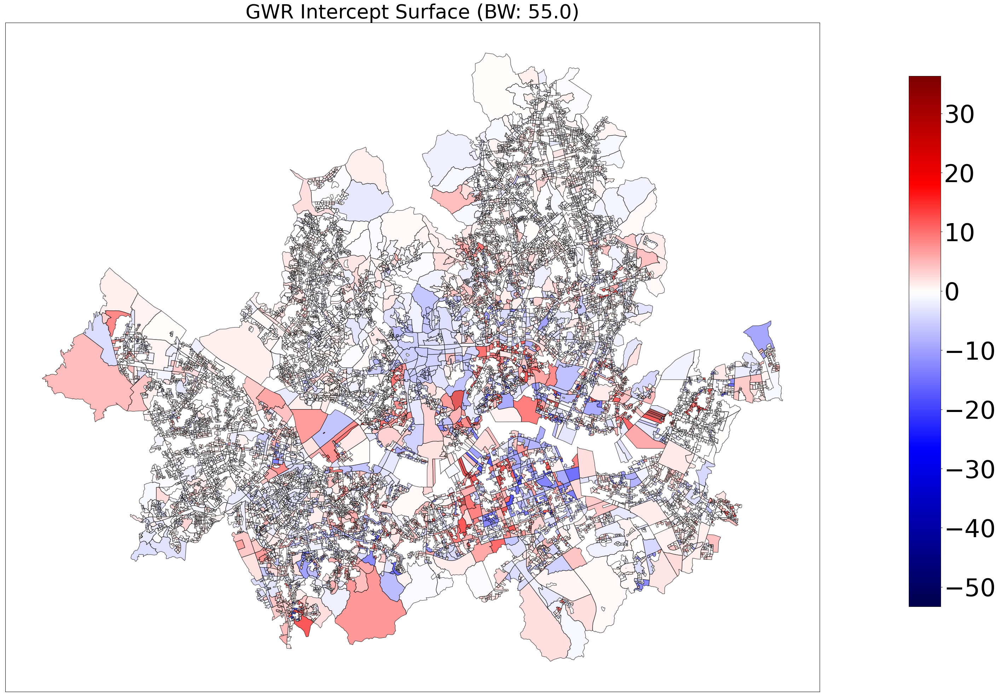

In [175]:
#Comparison maps of GWR vs. MGWR parameter surfaces where the grey units pertain to statistically insignificant parameters

#Prep plot and add axes
fig, ax = plt.subplots(1, figsize=(30,20))
ax.set_title('GWR Intercept Surface (BW: ' + str(gwr_bw) +')', fontsize=40)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the two combined datasets
vmin = s_geo_data['gwr_intercept'].min()
vmax = s_geo_data['gwr_intercept'].max()

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
s_geo_data.plot('gwr_intercept', cmap=sm.cmap, ax=ax, vmin=vmin, vmax=vmax, **{'edgecolor':'black', 'alpha':.65})
#If there are insignificnt parameters plot gray polygons over them
# if (gwr_filtered_t[:,0] == 0).any():
#     s_geo_data[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax0, **{'edgecolor':'black'})
 
#Set figure options and plot 
fig.tight_layout()    
fig.subplots_adjust(right=0.9)
cax = fig.add_axes([0.92, 0.14, 0.03, 0.75])
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.ax.tick_params(labelsize=50) 
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.show()

C:\Users\user\anaconda3\lib\site-packages\mgwr\utils.py:56: UserWarning: Trying to register the cmap 'shiftedcmap' which already exists.
  plt.register_cmap(cmap=new_cmap)


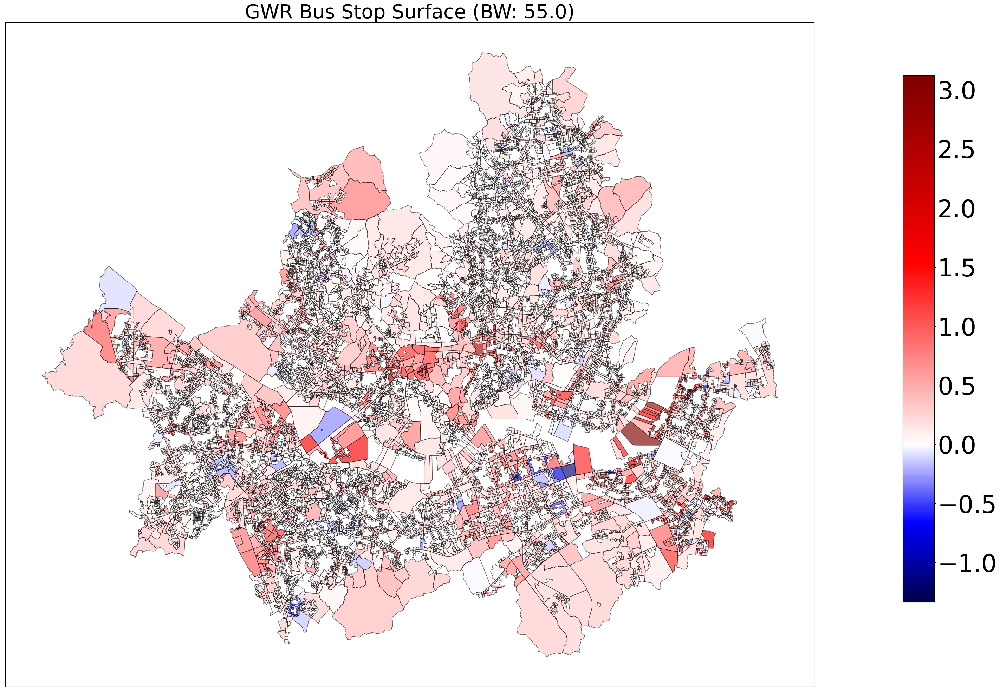

In [174]:
#Comparison maps of GWR vs. MGWR parameter surfaces where the grey units pertain to statistically insignificant parameters

#Prep plot and add axes
fig, ax = plt.subplots(1, figsize=(30,20))
ax.set_title('GWR Bus Stop Surface (BW: ' + str(gwr_bw) +')', fontsize=40)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the two combined datasets
vmin = s_geo_data['gwr_bus_stop'].min()
vmax = s_geo_data['gwr_bus_stop'].max()

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
s_geo_data.plot('gwr_bus_stop', cmap=sm.cmap, ax=ax, vmin=vmin, vmax=vmax, **{'edgecolor':'black', 'alpha':.65})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    s_geo_data[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax0, **{'edgecolor':'black'})
 
#Set figure options and plot 
fig.tight_layout()    
fig.subplots_adjust(right=0.9)
cax = fig.add_axes([0.92, 0.14, 0.03, 0.75])
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.ax.tick_params(labelsize=50) 
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.show()

C:\Users\user\anaconda3\lib\site-packages\mgwr\utils.py:56: UserWarning: Trying to register the cmap 'shiftedcmap' which already exists.
  plt.register_cmap(cmap=new_cmap)


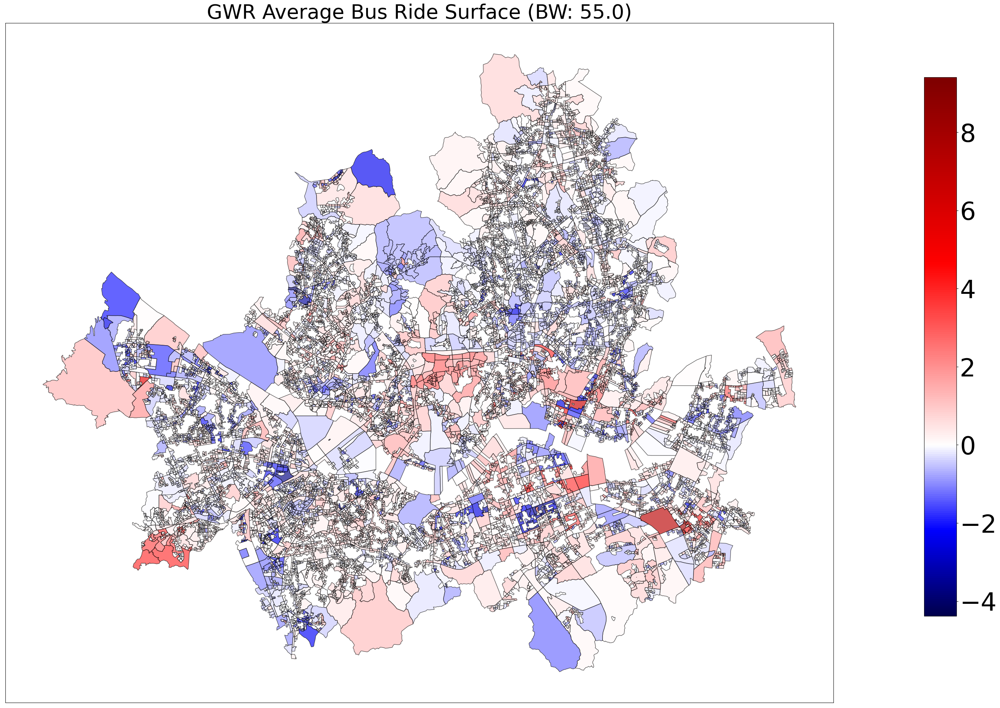

In [176]:
#Comparison maps of GWR vs. MGWR parameter surfaces where the grey units pertain to statistically insignificant parameters

#Prep plot and add axes
fig, ax = plt.subplots(1, figsize=(30,20))
ax.set_title('GWR Average Bus Ride Surface (BW: ' + str(gwr_bw) +')', fontsize=40)

#Set color mapb
cmap = plt.cm.seismic

#Find min and max values of the two combined datasets
vmin = s_geo_data['gwr_avg_ride'].min()
vmax = s_geo_data['gwr_avg_ride'].max()

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
s_geo_data.plot('gwr_avg_ride', cmap=sm.cmap, ax=ax, vmin=vmin, vmax=vmax, **{'edgecolor':'black', 'alpha':.65})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    s_geo_data[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax0, **{'edgecolor':'black'})
 
#Set figure options and plot 
fig.tight_layout()    
fig.subplots_adjust(right=0.9)
cax = fig.add_axes([0.92, 0.14, 0.03, 0.75])
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.ax.tick_params(labelsize=50) 
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.show()

C:\Users\user\anaconda3\lib\site-packages\mgwr\utils.py:56: UserWarning: Trying to register the cmap 'shiftedcmap' which already exists.
  plt.register_cmap(cmap=new_cmap)


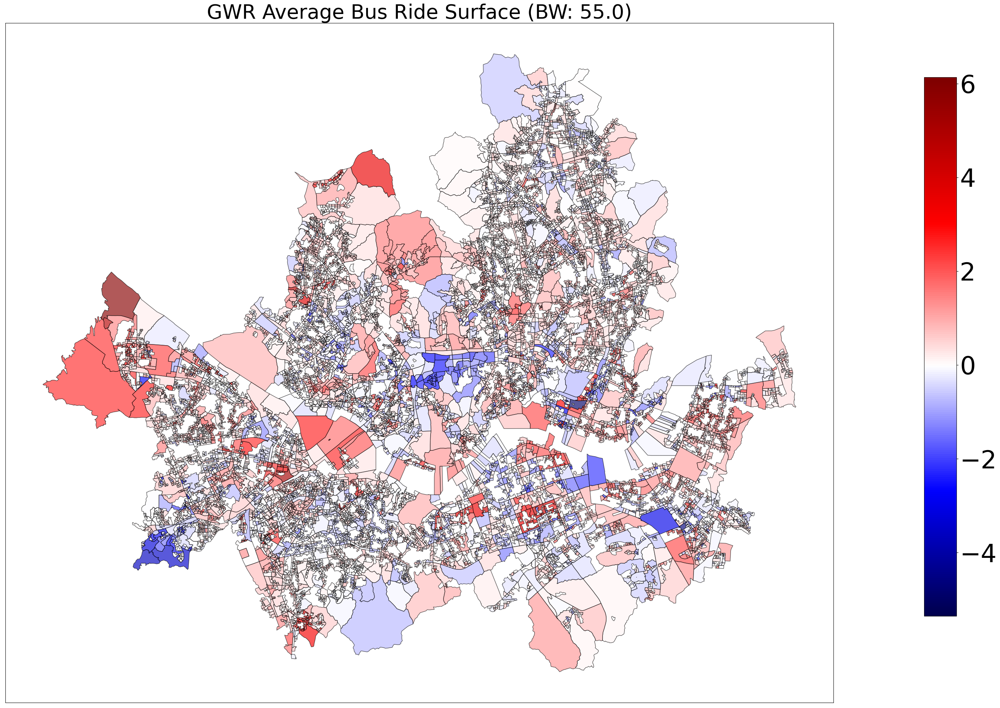

In [177]:
#Comparison maps of GWR vs. MGWR parameter surfaces where the grey units pertain to statistically insignificant parameters

#Prep plot and add axes
fig, ax = plt.subplots(1, figsize=(30,20))
ax.set_title('GWR Average Bus Ride Surface (BW: ' + str(gwr_bw) +')', fontsize=40)

#Set color mapb
cmap = plt.cm.seismic

#Find min and max values of the two combined datasets
vmin = s_geo_data['gwr_avg_get_off'].min()
vmax = s_geo_data['gwr_avg_get_off'].max()

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
s_geo_data.plot('gwr_avg_get_off', cmap=sm.cmap, ax=ax, vmin=vmin, vmax=vmax, **{'edgecolor':'black', 'alpha':.65})
# If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    s_geo_data[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax0, **{'edgecolor':'black'})
 
#Set figure options and plot 
fig.tight_layout()    
fig.subplots_adjust(right=0.9)
cax = fig.add_axes([0.92, 0.14, 0.03, 0.75])
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.ax.tick_params(labelsize=50) 
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.show()